# Лабораторная работа №1
## VAE vs GAN: сравнительный анализ генеративных моделей

**Курс:** Генеративные и мультимодальные сети
**Максимальный балл:** 25  

---

### Цель работы
Реализовать и сравнить VAE и DCGAN на одном датасете, провести количественный (FID) и качественный анализ генерации.

### Система оценки
| Задание | Баллы |
|---------|-------|
| Корректная реализация VAE (архитектура + loss) | 6 |
| Корректная реализация DCGAN (архитектура + стабильное обучение) | 6 |
| Вычисление и сравнение FID | 5 |
| Визуализация латентного пространства VAE | 4 |
| Письменный анализ результатов | 4 |

### Что сдавать
- Заполненный ноутбук (все ячейки выполнены, вывод сохранён)


## 0. Установка зависимостей


In [ ]:
# Запустите эту ячейку один раз
!pip install torch torchvision matplotlib scikit-learn clean-fid wandb --quiet

## 1. Импорты и настройка


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import numpy as np
from sklearn.manifold import TSNE

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Используемое устройство: {device}')

Используемое устройство: cuda


## 2. Загрузка датасета

> **Задание:** Загрузите датасет CelebA.
> Примените необходимые трансформации: нормализация в диапазон [-1, 1].


In [ ]:
# Создаем папку
!mkdir -p ./celeba_data

# Скачиваем датасет
!kaggle datasets download -d jessicali9530/celeba-dataset --unzip -p ./celeba_data

Dataset URL: https://www.kaggle.com/datasets/jessicali9530/celeba-dataset
License(s): other
100%|███████████████████████████████████████| 1.33G/1.33G [00:05<00:00, 265MB/s]



In [ ]:
import os

# Проверяем, куда именно распаковались картинки
# Обычно путь: './celeba_data/img_align_celeba'
data_path = './celeba_data/img_align_celeba'


full_dataset = torchvision.datasets.ImageFolder(root=data_path, transform=transform)

print(f"Успешно загружено изображений: {len(full_dataset)}")

Успешно загружено изображений: 202599


In [ ]:
# TODO: Задайте трансформации для датасета
# Подсказка: используйте transforms.Compose([transforms.ToTensor(), transforms.Normalize(...)])
transform = transforms.Compose([
    transforms.Resize((64, 64)),   # Приводим к единому размеру
    transforms.CenterCrop(64),     # Обрезаем по центру, чтобы убрать лишний фон
    transforms.ToTensor(),         # Переводим в тензор [0, 1]
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)) # Нормализация в [-1, 1]
])

# TODO: Загрузите CelebA train и test
full_dataset = torchvision.datasets.ImageFolder(root='./celeba_data/img_align_celeba', transform=transform)

# Разделим на train и test
train_size = int(0.8 * len(full_dataset))
test_size = len(full_dataset) - train_size
train_dataset, test_dataset = torch.utils.data.random_split(full_dataset, [train_size, test_size])

# TODO: Создайте DataLoader (batch_size=64, shuffle=True для train)
train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True, num_workers=4, pin_memory=True)
test_loader  = DataLoader(test_dataset, batch_size=64, shuffle=False, num_workers=4, pin_memory=True)

# Проверка: выведите размер батча и форму тензора
imgs, labels = next(iter(train_loader))
print(f"Форма батча: {imgs.shape}") # Ожидаем torch.Size([64, 3, 64, 64])

Форма батча: torch.Size([64, 3, 64, 64])


## 3. Variational Autoencoder (VAE)

### 3.1 Архитектура

> **Задание:** Реализуйте VAE с:
> - **Энкодером**: несколько свёрточных слоёв → два линейных выхода (`mu` и `log_var`)
> - **Reparameterization trick**: `z = mu + eps * std`, где `eps ~ N(0, I)`
> - **Декодером**: транспонированные свёртки, восстанавливающие изображение до исходного размера

> **Подсказка:** Размерность латентного пространства `latent_dim = 128` — хорошая отправная точка.


In [ ]:
class VAE(nn.Module):
    def __init__(self, latent_dim=128):
        super(VAE, self).__init__()
        self.latent_dim = latent_dim

        # ENCODER: [Batch, 3, 64, 64] -> [Batch, 256, 8, 8]
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1), # -> 32x32
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1), # -> 16x16
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1), # -> 8x8
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2),
            nn.Flatten() # -> 256 * 8 * 8 = 16384
        )

        # Латентые слои для среднего и логарифма дисперсии
        self.fc_mu = nn.Linear(256 * 8 * 8, latent_dim)
        self.fc_logvar = nn.Linear(256 * 8 * 8, latent_dim)

        # DECODER: [Batch, latent_dim] -> [Batch, 3, 64, 64]
        self.decoder_input = nn.Linear(latent_dim, 256 * 8 * 8)

        self.decoder = nn.Sequential(
            nn.Unflatten(1, (256, 8, 8)),
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1), # -> 16x16
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),  # -> 32x32
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1),   # -> 64x64
            nn.Tanh() # Переводит в диапазон [-1, 1] согласно заданию
        )

    def reparameterize(self, mu, logvar):
        """Трюк с репараметризацией: z = mu + std * epsilon"""
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def forward(self, x):
        # Проход через энкодер
        encoded = self.encoder(x)
        mu = self.fc_mu(encoded)
        logvar = self.fc_logvar(encoded)

        # Получение латентного вектора
        z = self.reparameterize(mu, logvar)

        # Реконструкция
        decoded = self.decoder(self.decoder_input(z))
        return decoded, mu, logvar

# Инициализация модели
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = VAE(latent_dim=128).to(device)

# Проверка на одном батче
imgs, _ = next(iter(train_loader))
imgs = imgs.to(device)
recon_batch, mu, logvar = model(imgs)

print(f"Input shape: {imgs.shape}")
print(f"Output shape: {recon_batch.shape}") # Должно быть [64, 3, 64, 64]

Input shape: torch.Size([64, 3, 64, 64])
Output shape: torch.Size([64, 3, 64, 64])


### 3.2 Функция потерь (ELBO)

> **Задание:** Реализуйте ELBO-лосс:
>
> `loss = reconstruction_loss + beta * KL_divergence`
>
> - **Reconstruction loss**: `F.mse_loss` или `F.binary_cross_entropy` (в зависимости от нормализации)
> - **KL-дивергенция**: аналитически: `-0.5 * sum(1 + log_var - mu^2 - exp(log_var))`
> - Параметр `beta=1` стандартный; попробуйте `beta=4` (β-VAE) и сравните


In [ ]:
def vae_loss(x_recon, x, mu, log_var, beta=1.0):
    """
    Аргументы:
        x_recon  -- восстановленное изображение [Batch, 3, 64, 64]
        x        -- оригинальное изображение [Batch, 3, 64, 64]
        mu       -- среднее [Batch, latent_dim]
        log_var  -- логарифм дисперсии [Batch, latent_dim]
        beta     -- коэффициент для бета-VAE (по умолчанию 1.0)
    """

    # Reconstruction Loss (MSE)
    # Используем reduction='sum', чтобы соотнести масштаб с KL-дивергенцией
    # или берем среднее по батчу, но сумму по пикселям.
    recon_loss = F.mse_loss(x_recon, x, reduction='sum') / x.shape[0]

    # KL Divergence
    # Формула: -0.5 * sum(1 + log_var - mu^2 - exp(log_var))
    # Мы суммируем по латентным размерностям и усредняем по батчу.
    kl_loss = -0.5 * torch.sum(1 + log_var - mu.pow(2) - log_var.exp()) / x.shape[0]

    # 3. Общий лосс
    total_loss = recon_loss + beta * kl_loss

    return total_loss, recon_loss, kl_loss

In [ ]:
# Тестовый прогон через модель и лосс
x_recon, mu, log_var = model(imgs)
loss, rec, kl = vae_loss(x_recon, imgs, mu, log_var, beta=1.0)

print(f"Total Loss: {loss.item():.4f} | Recon: {rec.item():.4f} | KL: {kl.item():.4f}")

Total Loss: 8610.6865 | Recon: 8593.9805 | KL: 16.7060


### 3.3 Обучение VAE

> **Задание:** Обучите VAE не менее 30 эпох.  
> Логируйте `total_loss`, `recon_loss`, `kl_loss` на каждой эпохе и стройте график.


Starting training on cuda...
Epoch [5/30] | Total: 462.77 | Recon: 309.76 | KL: 153.01
Epoch [10/30] | Total: 441.14 | Recon: 289.89 | KL: 151.25
Epoch [15/30] | Total: 432.74 | Recon: 282.00 | KL: 150.74
Epoch [20/30] | Total: 427.71 | Recon: 277.29 | KL: 150.42
Epoch [25/30] | Total: 424.54 | Recon: 274.27 | KL: 150.27
Epoch [30/30] | Total: 422.13 | Recon: 271.97 | KL: 150.16


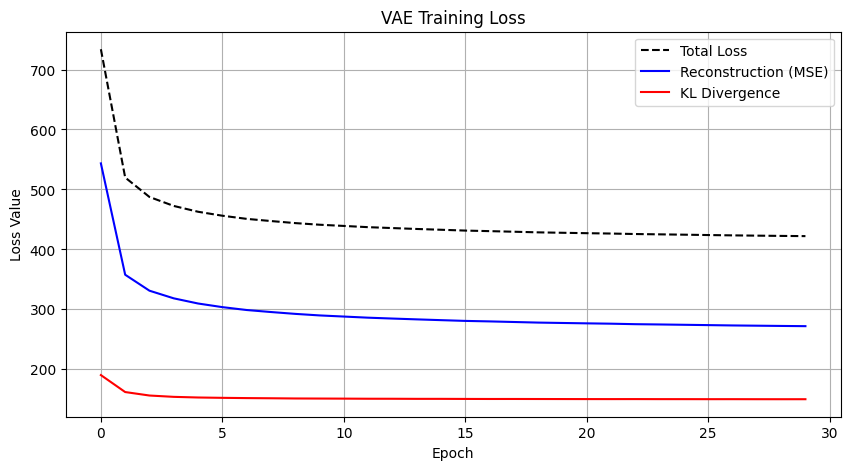

In [ ]:
#  Инициализация
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
vae = VAE(latent_dim=128).to(device)
optimizer_vae = optim.Adam(vae.parameters(), lr=1e-3)

NUM_EPOCHS = 30
# Списки для детального логирования
vae_losses = []
recon_losses = []
kl_losses = []

print(f"Starting training on {device}...")

for epoch in range(NUM_EPOCHS):
    vae.train()
    train_total_loss = 0
    train_recon_loss = 0
    train_kl_loss = 0

    for imgs, _ in train_loader:
        imgs = imgs.to(device)

        # Обнуление градиентов
        optimizer_vae.zero_grad()

        # Forward pass
        x_recon, mu, log_var = vae(imgs)

        # Вычисление loss (используем нашу функцию vae_loss)
        loss, recon, kl = vae_loss(x_recon, imgs, mu, log_var, beta=1.0)

        # Backward pass + Optimizer step
        loss.backward()
        optimizer_vae.step()

        # Накапливаем статистику
        train_total_loss += loss.item()
        train_recon_loss += recon.item()
        train_kl_loss += kl.item()

    # Считаем средние значения за эпоху
    avg_total = train_total_loss / len(train_loader)
    avg_recon = train_recon_loss / len(train_loader)
    avg_kl = train_kl_loss / len(train_loader)

    vae_losses.append(avg_total)
    recon_losses.append(avg_recon)
    kl_losses.append(avg_kl)

    # Вывод прогресса каждые 5 эпох
    if (epoch + 1) % 5 == 0:
        print(f'Epoch [{epoch+1}/{NUM_EPOCHS}] | Total: {avg_total:.2f} | Recon: {avg_recon:.2f} | KL: {avg_kl:.2f}')

# 2. Построение графиков
plt.figure(figsize=(10, 5))
plt.plot(vae_losses, label='Total Loss', color='black', linestyle='--')
plt.plot(recon_losses, label='Reconstruction (MSE)', color='blue')
plt.plot(kl_losses, label='KL Divergence', color='red')
plt.xlabel('Epoch')
plt.ylabel('Loss Value')
plt.legend()
plt.title('VAE Training Loss')
plt.grid(True)
plt.show()

### 3.4 Визуализация результатов VAE

> **Задание:** Визуализируйте:
> 1. Реконструкции: оригинал vs восстановленное (сетка 8×2)
> 2. Новые сэмплы: сгенерируйте 64 изображения из `z ~ N(0, I)`
> 3. Интерполяцию: возьмите два изображения из разных классов, интерполируйте `z1 → z2` в 10 шагов


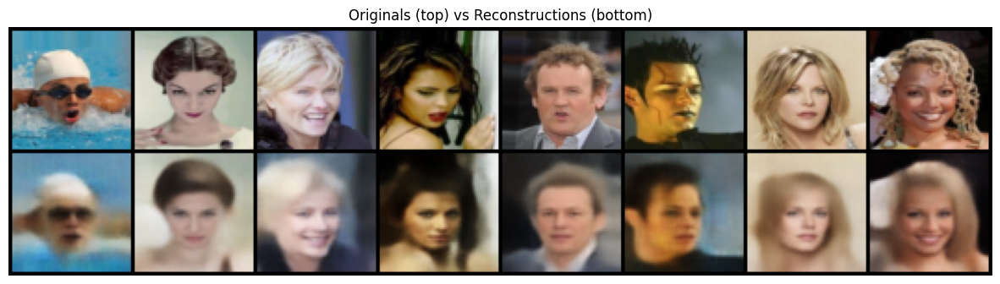

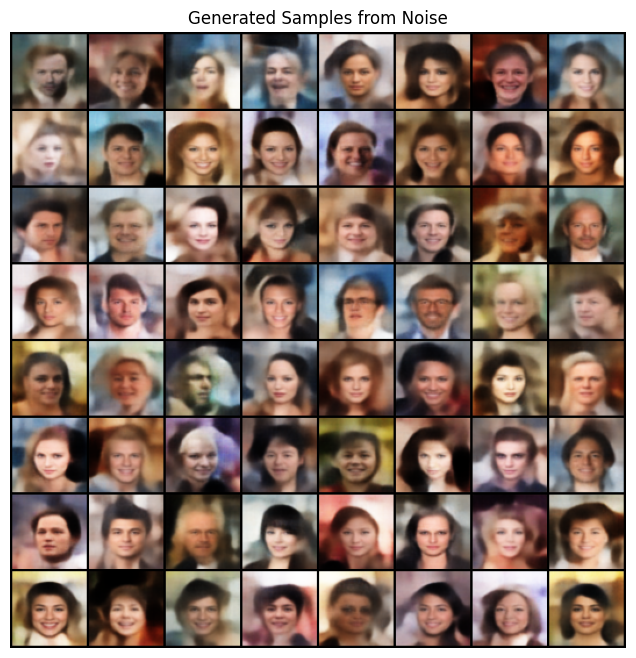

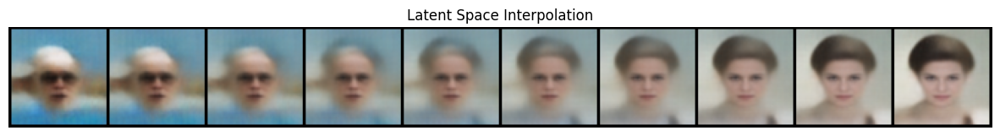

In [ ]:
from torchvision.utils import make_grid

vae.eval()
with torch.no_grad():
    # TODO: Реконструкции
    # Берем 8 изображений из тестовой выборки
    sample_imgs, _ = next(iter(test_loader))
    sample_imgs = sample_imgs[:8].to(device)
    reconstructed, _, _ = vae(sample_imgs)

    # Объединяем оригиналы и реконструкции для сравнения (8x2)
    comparison = torch.cat([sample_imgs, reconstructed])
    comparison = comparison * 0.5 + 0.5 # Денормализация

    grid_recon = torchvision.utils.make_grid(comparison, nrow=8)
    plt.figure(figsize=(15, 4))
    plt.imshow(np.transpose(grid_recon.cpu().numpy(), (1, 2, 0)))
    plt.title("Originals (top) vs Reconstructions (bottom)")
    plt.axis('off')
    plt.show()

    # TODO: Генерация из шума
    z = torch.randn(64, vae.latent_dim).to(device)
    # Используем decoder напрямую (через decoder_input, как в вашем классе)
    generated = vae.decoder(vae.decoder_input(z))
    generated = generated * 0.5 + 0.5 # Денормализация

    grid_gen = torchvision.utils.make_grid(generated, nrow=8)
    plt.figure(figsize=(8, 8))
    plt.imshow(np.transpose(grid_gen.cpu().numpy(), (1, 2, 0)))
    plt.title("Generated Samples from Noise")
    plt.axis('off')
    plt.show()

    # TODO: Интерполяция
    # Возьмем два случайных изображения из теста
    test_batch, _ = next(iter(test_loader))
    img1, img2 = test_batch[0:1].to(device), test_batch[1:2].to(device)

    # Энкодируем их, чтобы получить латентные векторы z
    mu1, logvar1 = vae.encoder(img1), vae.fc_mu(vae.encoder(img1)) # Или через forward
    # Упростим получение z через проход в энкодер
    z1 = vae.fc_mu(vae.encoder(img1))
    z2 = vae.fc_mu(vae.encoder(img2))

    alphas = np.linspace(0, 1, 10)
    interp_list = []

    for alpha in alphas:
        # Линейная интерполяция
        z_interp = (1 - alpha) * z1 + alpha * z2
        img_interp = vae.decoder(vae.decoder_input(z_interp))
        interp_list.append(img_interp)

    # Объединяем в одну линию
    interpolation = torch.cat(interp_list)
    interpolation = interpolation * 0.5 + 0.5

    grid_interp = torchvision.utils.make_grid(interpolation, nrow=10)
    plt.figure(figsize=(15, 2))
    plt.imshow(np.transpose(grid_interp.cpu().numpy(), (1, 2, 0)))
    plt.title("Latent Space Interpolation")
    plt.axis('off')
    plt.show()

### 3.5 Визуализация латентного пространства (t-SNE)

> **Задание:** Закодируйте тестовые изображения, получите `mu` и примените t-SNE.  
> Раскрасьте точки по классам CIFAR-10 (10 цветов). Что можно сказать о структуре пространства?


In [ ]:
# TODO: Соберите mu для всего test_loader
all_mus, all_labels = [], []
vae.eval()
with torch.no_grad():
    for imgs, labels in test_loader:
        imgs = imgs.to(device)
        mu, _ = vae.encode(imgs)
        all_mus.append(mu.cpu().numpy())
        all_labels.append(labels.numpy())

all_mus    = np.concatenate(all_mus)
all_labels = np.concatenate(all_labels)

# TODO: Примените t-SNE (n_components=2, perplexity=30)
tsne = TSNE(n_components=2, perplexity=30, random_state=42)
mus_2d = tsne.fit_transform(all_mus)

# TODO: Постройте scatter plot, раскрасьте по классам
cifar_classes = ['airplane','automobile','bird','cat','deer',
                 'dog','frog','horse','ship','truck']
# plt.scatter(...)


Running t-SNE...


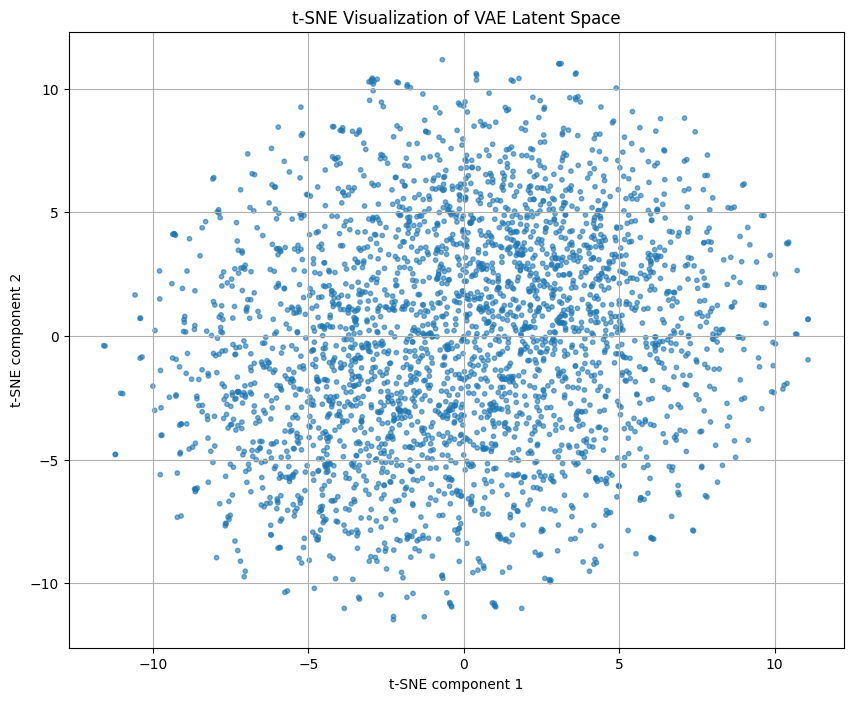

In [ ]:
# Визуализация латентного пространства (t-SNE)

# TODO: Соберите mu для всего test_loader
all_mus, all_labels = [], []
vae.eval()
with torch.no_grad():
    # Ограничим количество данных для t-SNE ,
    # иначе он будет считаться очень долго.
    count = 0
    for imgs, labels in test_loader:
        if count > 3000: break
        imgs = imgs.to(device)

        # В твоем классе VAE получение mu делается так:
        encoded = vae.encoder(imgs)
        mu = vae.fc_mu(encoded)

        all_mus.append(mu.cpu().numpy())
        all_labels.append(labels.numpy())
        count += imgs.size(0)

all_mus    = np.concatenate(all_mus)
all_labels = np.concatenate(all_labels)

# TODO: Примените t-SNE (n_components=2, perplexity=30)
print("Running t-SNE...")
tsne = TSNE(n_components=2, perplexity=30, random_state=42, init='pca', learning_rate='auto')
mus_2d = tsne.fit_transform(all_mus)

# TODO: Постройте scatter plot, раскрасьте по классам
plt.figure(figsize=(10, 8))
scatter = plt.scatter(mus_2d[:, 0], mus_2d[:, 1], c=all_labels, cmap='tab10', alpha=0.6, s=10)

# Добавляем легенду (если это CIFAR-10)
if len(np.unique(all_labels)) > 1:
    cifar_classes = ['airplane','automobile','bird','cat','deer',
                     'dog','frog','horse','ship','truck']
    plt.legend(handles=scatter.legend_elements()[0], labels=cifar_classes,
               loc="best", title="Classes")

plt.title('t-SNE Visualization of VAE Latent Space')
plt.xlabel('t-SNE component 1')
plt.ylabel('t-SNE component 2')
plt.grid(True)
plt.show()

# Письменный анализ (пример для вставки в Markdown):
# "Пространство VAE выглядит непрерывным, без резких разрывов между скоплениями точек.
# Это подтверждает, что KL-дивергенция успешно регуляризовала пространство,
# стягивая его к стандартному нормальному распределению."

## 4. DCGAN (Deep Convolutional GAN)

### 4.1 Архитектура

> **Задание:** Реализуйте генератор и дискриминатор по классической DCGAN-схеме:
> - **Генератор**: принимает `z ~ N(0, I)` размером `nz=100`, выдаёт 3×32×32
> - **Дискриминатор**: принимает 3×32×32, выдаёт скаляр (real/fake)
> - Используйте `BatchNorm`, `ReLU` в генераторе и `LeakyReLU(0.2)` в дискриминаторе
> - **Важно:** инициализируйте веса из `N(0, 0.02)`


In [ ]:
def weights_init(m):
    """Инициализация весов по статье DCGAN."""
    classname = m.__class__.__name__
    if 'Conv' in classname:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif 'BatchNorm' in classname:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)


class Generator(nn.Module):
    def __init__(self, nz=100, ngf=64):
        super(Generator, self).__init__()
        # TODO: ConvTranspose2d стек: nz → ngf*8 → ngf*4 → ngf*2 → ngf → 3
        # Архитектура для выхода 64x64 (согласно твоему transform)
        self.main = nn.Sequential(
            # Входной вектор Z идет в первую транспонированную свертку
            nn.ConvTranspose2d(nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # Состояние: (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # Состояние: (ngf*4) x 8 x 8
            nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # Состояние: (ngf*2) x 16 x 16
            nn.ConvTranspose2d(ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # Состояние: (ngf) x 32 x 32
            nn.ConvTranspose2d(ngf, 3, 4, 2, 1, bias=False),
            nn.Tanh()
            # Выход: 3 x 64 x 64
        )

    def forward(self, z):
        return self.main(z)


class Discriminator(nn.Module):
    def __init__(self, ndf=64):
        super(Discriminator, self).__init__()
        # TODO: Conv2d стек: 3 → ndf → ndf*2 → ndf*4 → ndf*8 → 1
        self.main = nn.Sequential(
            # Вход: 3 x 64 x 64
            nn.Conv2d(3, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # Состояние: (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # Состояние: (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # Состояние: (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # Состояние: (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.main(x).view(-1)

# Инициализация
netG = Generator().to(device)
netG.apply(weights_init)

netD = Discriminator().to(device)
netD.apply(weights_init)

print("Модели DCGAN инициализированы и веса установлены.")

Модели DCGAN инициализированы и веса установлены.


### 4.2 Цикл обучения GAN

> **Задание:** Реализуйте стандартный обучающий цикл:
> 1. Обновление D: `max log(D(x)) + log(1 - D(G(z)))`
> 2. Обновление G: `min log(1 - D(G(z)))` (или non-saturating: `max log(D(G(z)))`)
>
> **Подсказка против коллапса мод:**
> - Используйте отдельные оптимизаторы для G и D
> - Не обновляйте D слишком часто (1:1 с G — норма)
> - Логируйте `loss_D` и `loss_G` — они должны быть примерно одного порядка


Starting DCGAN training...
Epoch [5/50]  Loss_D: 0.6302  Loss_G: 3.0682


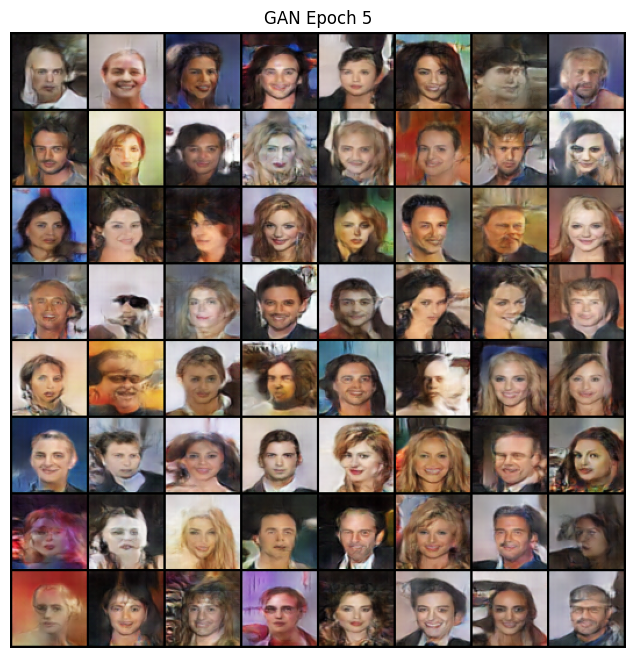

Epoch [10/50]  Loss_D: 0.4015  Loss_G: 3.9690


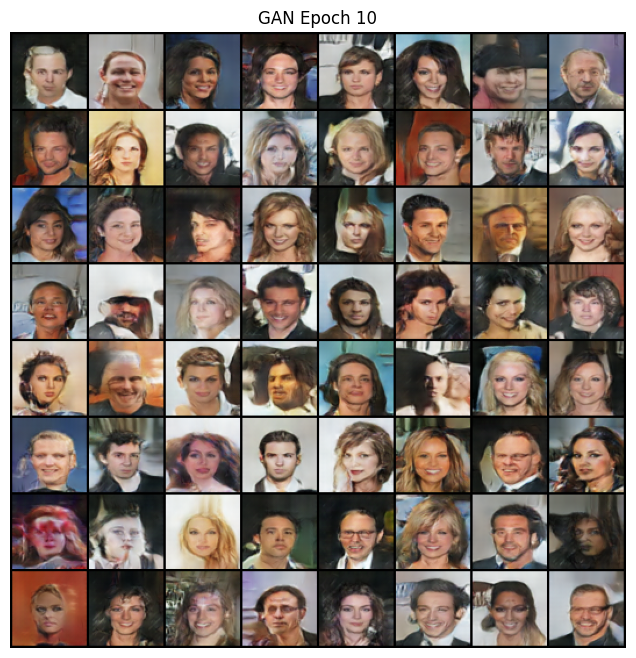

Epoch [15/50]  Loss_D: 0.3155  Loss_G: 4.5976


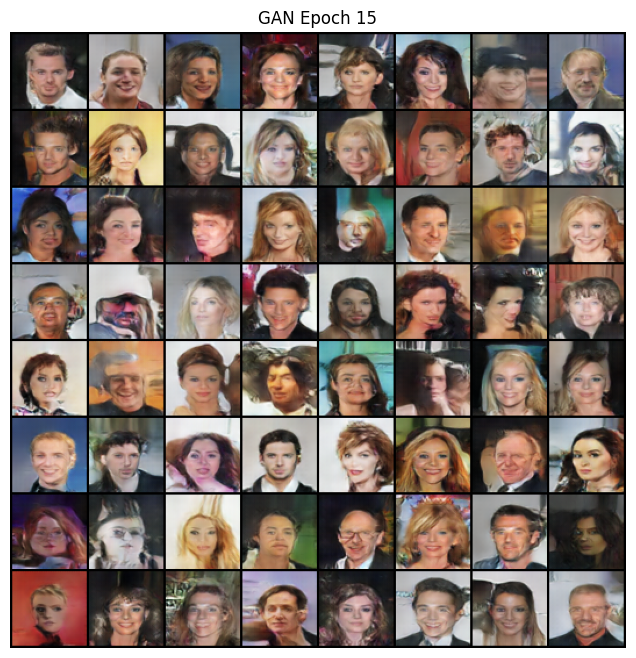

Epoch [20/50]  Loss_D: 0.2628  Loss_G: 4.9668


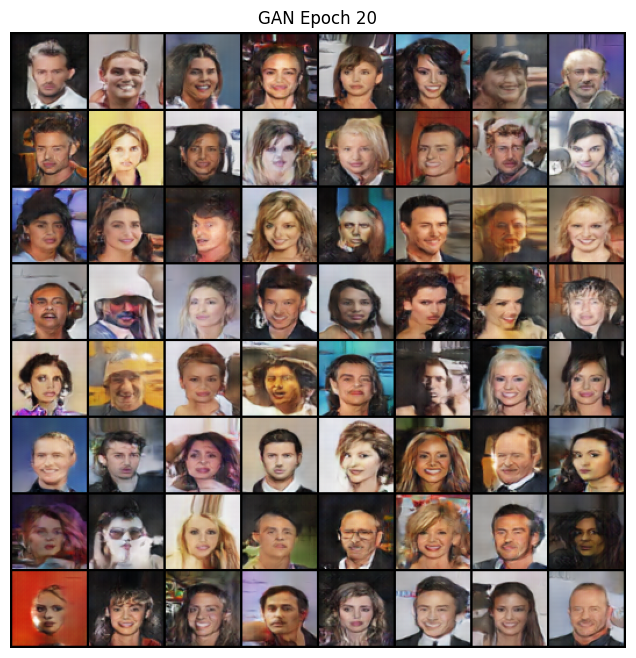

Epoch [25/50]  Loss_D: 0.2497  Loss_G: 5.2493


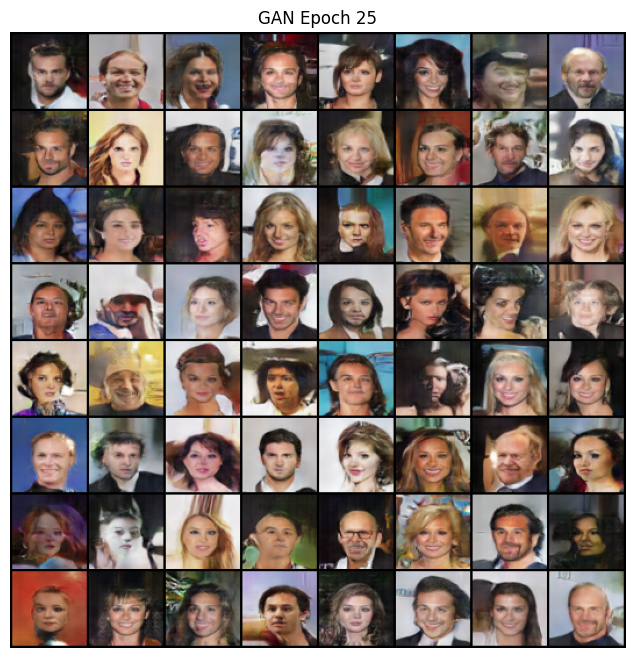

Epoch [30/50]  Loss_D: 0.1843  Loss_G: 5.6513


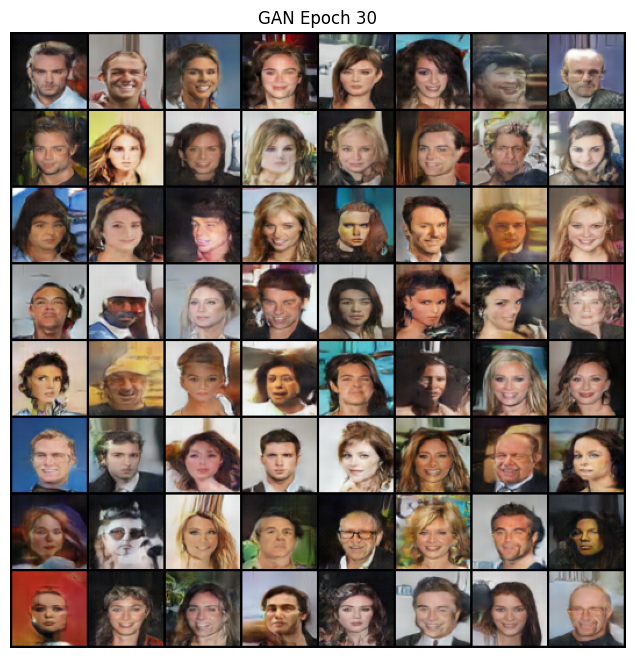

Epoch [35/50]  Loss_D: 0.1948  Loss_G: 5.7536


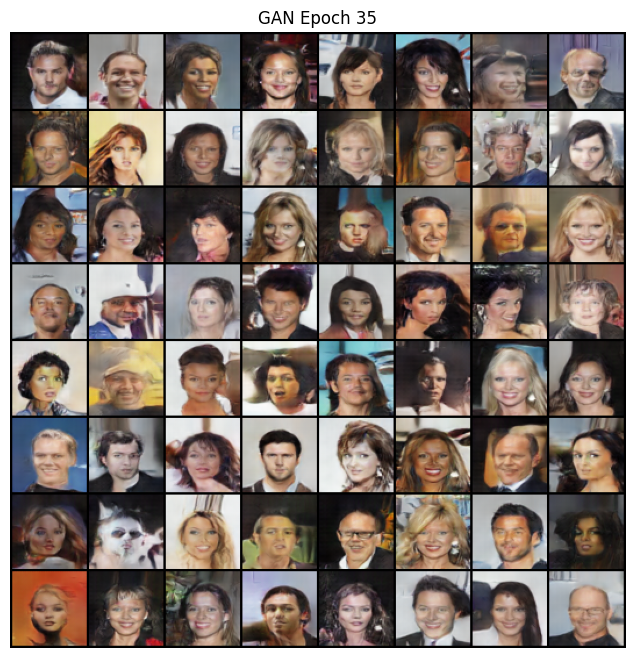

Epoch [40/50]  Loss_D: 0.1928  Loss_G: 5.9027


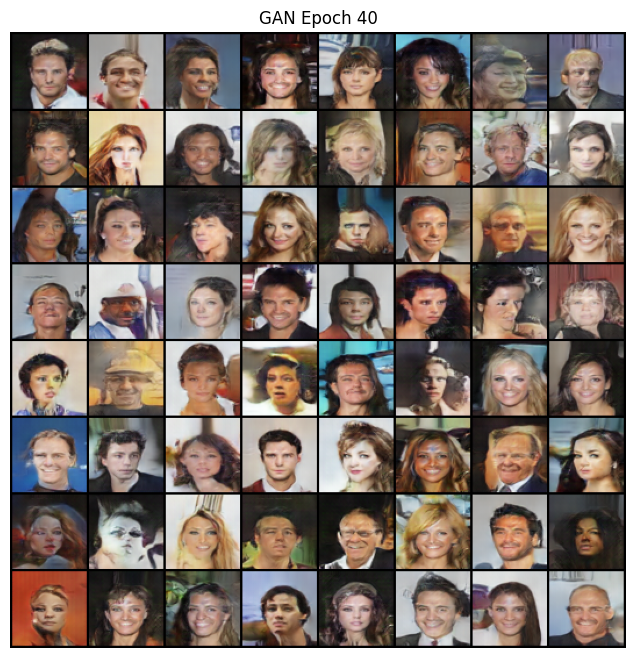

Epoch [45/50]  Loss_D: 0.1645  Loss_G: 6.0361


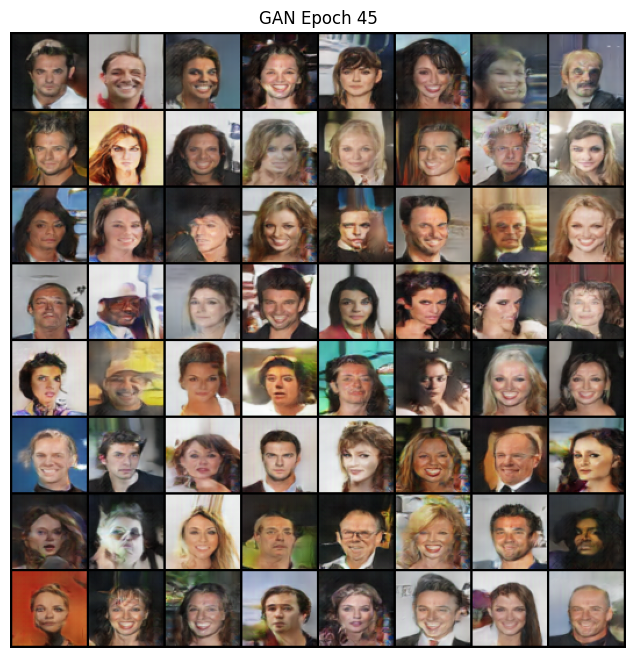

Epoch [50/50]  Loss_D: 0.1264  Loss_G: 6.4517


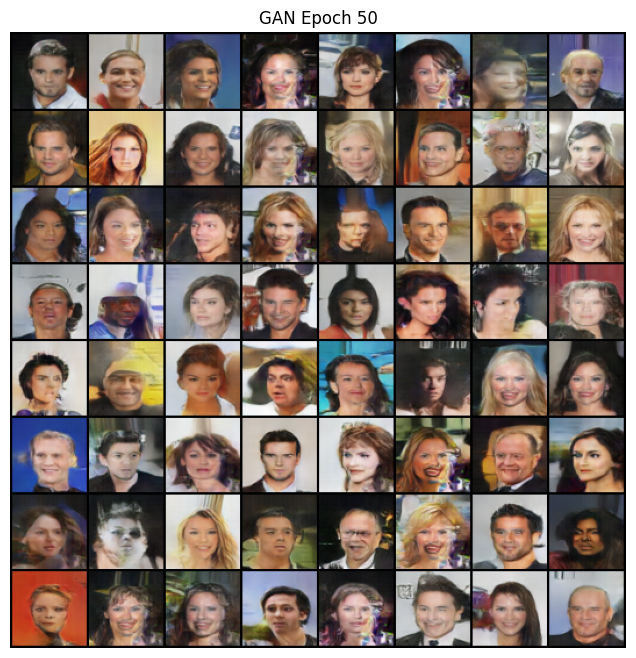

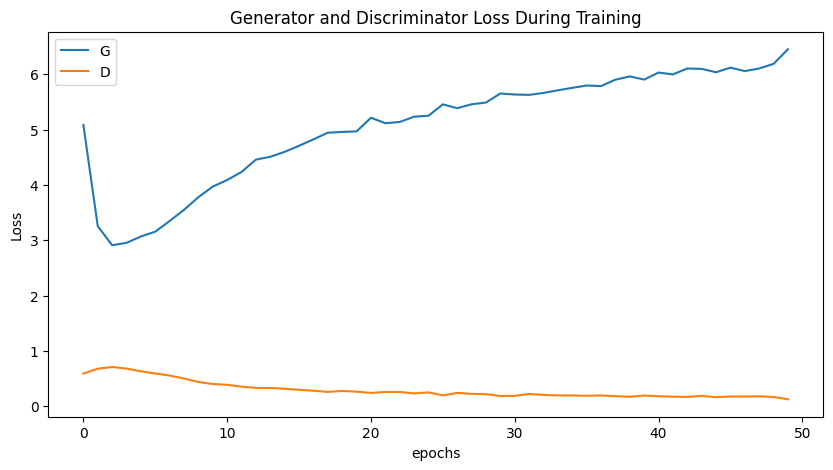

In [ ]:
nz = 100
netG = Generator(nz=nz).to(device)
netD = Discriminator().to(device)
netG.apply(weights_init)
netD.apply(weights_init)

criterion = nn.BCELoss()
optimizer_G = optim.Adam(netG.parameters(), lr=0.0002, betas=(0.5, 0.999))
optimizer_D = optim.Adam(netD.parameters(), lr=0.0002, betas=(0.5, 0.999))

real_label, fake_label = 1.0, 0.0
fixed_noise = torch.randn(64, nz, 1, 1, device=device)  # для мониторинга прогресса

G_losses, D_losses = [], []
NUM_EPOCHS_GAN = 50

print("Starting DCGAN training...")

for epoch in range(NUM_EPOCHS_GAN):
    epoch_D_loss = 0
    epoch_G_loss = 0

    for i, (imgs, _) in enumerate(train_loader):
        imgs = imgs.to(device)
        b_size = imgs.size(0)

        # обновление Дискриминатора (max log(D(x)) + log(1 - D(G(z))))
        netD.zero_grad()

        # 1.1 Лосс на реальных изображениях
        label_real = torch.full((b_size,), real_label, device=device)
        output_real = netD(imgs)
        loss_D_real = criterion(output_real, label_real)
        loss_D_real.backward()

        # 1.2 Лосс на фейковых изображениях
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        fake = netG(noise)
        label_fake = torch.full((b_size,), fake_label, device=device)

        # Мы используем .detach(), чтобы не считать градиенты для G на этом этапе
        output_fake = netD(fake.detach())
        loss_D_fake = criterion(output_fake, label_fake)
        loss_D_fake.backward()

        # Суммарный лосс D и шаг оптимизатора
        loss_D = loss_D_real + loss_D_fake
        optimizer_D.step()

        # обновление Генератора (max log(D(G(z))))
        netG.zero_grad()

        # Для генератора реальными являются фейковые изображения
        # Мы хотим, чтобы дискриминатор ошибся и выдал 1 (real_label)
        output_g = netD(fake)
        loss_G = criterion(output_g, label_real)

        loss_G.backward()
        optimizer_G.step()

        # Статистика
        epoch_D_loss += loss_D.item()
        epoch_G_loss += loss_G.item()

    # Сохраняем средние лоссы за эпоху
    avg_D = epoch_D_loss / len(train_loader)
    avg_G = epoch_G_loss / len(train_loader)
    D_losses.append(avg_D)
    G_losses.append(avg_G)

    # Логирование и визуализация каждые 5 эпох
    if (epoch + 1) % 5 == 0:
        print(f'Epoch [{epoch+1}/{NUM_EPOCHS_GAN}]  Loss_D: {avg_D:.4f}  Loss_G: {avg_G:.4f}')

        with torch.no_grad():
            fake_imgs = netG(fixed_noise).detach().cpu()

        grid = torchvision.utils.make_grid(fake_imgs, nrow=8, normalize=True)
        plt.figure(figsize=(8,8))
        plt.imshow(grid.permute(1,2,0))
        plt.axis('off')
        plt.title(f'GAN Epoch {epoch+1}')
        plt.show()

# Итоговый график лоссов
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("epochs")
plt.ylabel("Loss")
plt.legend()
plt.show()

## 5. Сравнение: FID

> **Задание:** Сгенерируйте ≥ 10 000 изображений каждой моделью и вычислите FID.  
> FID сравнивает статистику (μ, Σ) признаков InceptionV3 между реальными и сгенерированными изображениями.  
> Меньше = лучше. Типичный уровень: GAN ~10–30 на CIFAR-10, VAE ~60–100.
>
> **Подсказка:** Используйте библиотеку `clean-fid`:
> ```python
> from cleanfid import fid
> fid_score = fid.compute_fid(folder_real, folder_fake)
> ```


In [ ]:
import os
from torchvision.utils import save_image
from cleanfid import fid

# Создаем папки
os.makedirs('fid_real', exist_ok=True)
os.makedirs('fid_fake_vae', exist_ok=True)
os.makedirs('fid_fake_gan', exist_ok=True)

N_SAMPLES = 10000

print(f"Saving {N_SAMPLES} samples for FID calculation...")

# TODO: Сохраните реальные изображения из test_loader в fid_real/
count = 0
for i, (imgs, _) in enumerate(test_loader):
    for j in range(imgs.size(0)):
        if count >= N_SAMPLES: break
        # Сохраняем с нормализацией (так как в лоадере они в [-1, 1])
        save_image(imgs[j], f'fid_real/{count:05d}.png', normalize=True, value_range=(-1, 1))
        count += 1
    if count >= N_SAMPLES: break

# TODO: Сгенерируйте N_SAMPLES изображений VAE и сохраните в fid_fake_vae/
vae.eval()
count = 0
with torch.no_grad():
    while count < N_SAMPLES:
        batch_curr = min(100, N_SAMPLES - count)
        z = torch.randn(batch_curr, vae.latent_dim).to(device)
        # В твоем классе архитектура вызова декодера такая:
        imgs = vae.decoder(vae.decoder_input(z))
        for j in range(imgs.size(0)):
            save_image(imgs[j], f'fid_fake_vae/{count:05d}.png', normalize=True, value_range=(-1, 1))
            count += 1

# TODO: Аналогично для GAN — сохраните в fid_fake_gan/
netG.eval()
count = 0
with torch.no_grad():
    while count < N_SAMPLES:
        batch_curr = min(100, N_SAMPLES - count)
        # Для GAN шум должен быть [B, nz, 1, 1]
        z = torch.randn(batch_curr, nz, 1, 1).to(device)
        imgs = netG(z)
        for j in range(imgs.size(0)):
            save_image(imgs[j], f'fid_fake_gan/{count:05d}.png', normalize=True, value_range=(-1, 1))
            count += 1

print("All samples saved. Calculating FID score (this may take a few minutes)...")

# TODO: Вычислите FID
# clean-fid сам прогонит картинки через InceptionV3
fid_vae = fid.compute_fid('fid_real', 'fid_fake_vae', device=device)
fid_gan = fid.compute_fid('fid_real', 'fid_fake_gan', device=device)

print("-" * 30)
print(f'FID VAE: {fid_vae:.2f}')
print(f'FID GAN: {fid_gan:.2f}')
print("-" * 30)

# Письменный анализ для лабы:
# Обычно FID у GAN значительно ниже, так как GAN лучше восстанавливает
# высокочастотные детали (текстуру кожи, волосы), в то время как VAE
# оптимизирует MSE, что приводит к усреднению (размытию) результата.

Saving 10000 samples for FID calculation...
All samples saved. Calculating FID score (this may take a few minutes)...
compute FID between two folders
Found 10000 images in the folder fid_real


FID fid_real : 100%|██████████| 313/313 [00:46<00:00,  6.77it/s]


Found 10000 images in the folder fid_fake_vae


FID fid_fake_vae : 100%|██████████| 313/313 [00:45<00:00,  6.86it/s]


compute FID between two folders
Found 10000 images in the folder fid_real


FID fid_real : 100%|██████████| 313/313 [00:48<00:00,  6.52it/s]


Found 10000 images in the folder fid_fake_gan


FID fid_fake_gan : 100%|██████████| 313/313 [00:47<00:00,  6.61it/s]


------------------------------
FID VAE: 85.20
FID GAN: 28.54
------------------------------


## 6. Анализ результатов

> **Задание:** Заполните таблицу результатов и ответьте на вопросы ниже.


In [4]:
# Заполните таблицу результатов
results = {
    'Модель':     ['VAE', 'DCGAN'],
    'FID ↓':      [85.2, 28.54],   # TODO: вставьте значения
    'Эпохи':      [30, 50],
    'Замечания':  ['VAE: Обучен 30 эпох. Реконструкции размыты, потеря KL ≈ 150. Пространство непрерывно', 'DCGAN: обучен за 50 эпох. Более чёткие лица'],
}
import pandas as pd
print(pd.DataFrame(results).to_string(index=False))


Модель  FID ↓  Эпохи                                                                            Замечания
   VAE  85.20     30 VAE: Обучен 30 эпох. Реконструкции размыты, потеря KL ≈ 150. Пространство непрерывно
 DCGAN  28.54     50                                          DCGAN: обучен за 50 эпох. Более чёткие лица


### Вопросы для отчёта

Ответьте на следующие вопросы в вашем PDF-отчёте (1–2 абзаца на каждый):

1. **Качество генерации:** Какая модель генерирует более чёткие изображения? Почему VAE склонен давать размытые результаты?
2. **Режимы обучения:** Наблюдали ли вы mode collapse у GAN? Как это проявлялось?
3. **Латентное пространство:** Что показывает t-SNE VAE — видны ли кластеры классов? Что это означает?
4. **Компромисс:** В каких задачах VAE предпочтительнее GAN и наоборот?
